<a href="https://colab.research.google.com/github/RIT20/plant-pathlogy/blob/master/plant_pathology.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('/content/drive') 

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
import pandas as pd
train=pd.read_csv('/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/train.csv')
train.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [0]:
import pandas as pd
test=pd.read_csv('/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/test.csv')

In [3]:
!unzip -uq "/content/drive/My Drive/PATH_TO_ZIP" -d "/content/drive/My Drive/plant pathology/plant-pathology/fgvc7/images"

unzip:  cannot find or open /content/drive/My Drive/PATH_TO_ZIP, /content/drive/My Drive/PATH_TO_ZIP.zip or /content/drive/My Drive/PATH_TO_ZIP.ZIP.


In [0]:
!pip install -q keras

In [5]:
import keras

Using TensorFlow backend.


In [0]:
!pip install -q efficientnet

In [0]:
import os
import gc
import re

import cv2
import math
import numpy as np
import scipy as sp
import pandas as pd

import tensorflow as tf
from IPython.display import SVG
import efficientnet.tfkeras as efn
from keras.utils import plot_model
import tensorflow.keras.layers as L
from keras.utils import model_to_dot
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model

from tensorflow.keras.applications import DenseNet121


import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

np.random.seed(0)
tf.random.set_seed(0)

import warnings
warnings.filterwarnings("ignore")

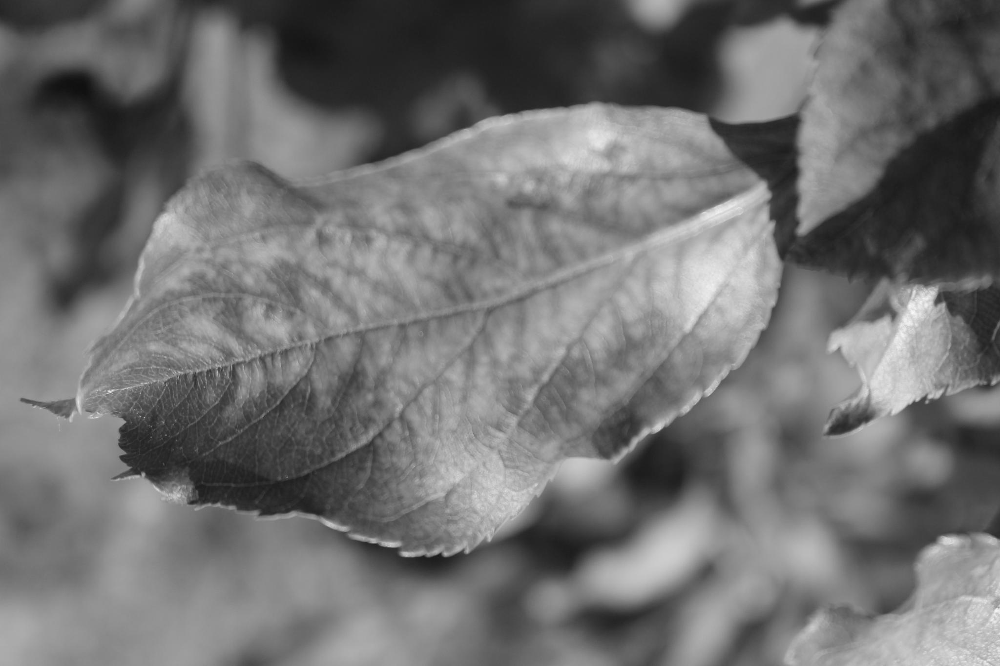

DisabledFunctionError: ignored

In [10]:
import cv2
from google.colab.patches import cv2_imshow


path=r'/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/images/Train_0.jpg'
img=cv2.imread(path,0)
cv2_imshow(img)
cv2.imshow('image', img)

In [11]:
def duplicacy(df1,df2,image_id):
  df1_unique=set(df1['image_id'].values)
  df2_unique=set(df2['image_id'].values)
  both_together=list(df1_unique.intersection(df2_unique))

  return both_together
duplicacy(train,test,'image_id')  

[]

In [12]:
image_path='/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/images'

import random
images=train['image_id'].values
random_images=[np.random.choice(images+'.jpg') for i in range(6)]

img_dir=image_path

print('display random images')
plt.figure(figsize=(15,10))

for i in range (6):
    plt.subplots(2,3,i+1)
    img=cv2.imread(os.path.join(img_dir,random_images[i]))
    plt.imshow(img , cmap='gray')
    plt.axis('off')
plt.tight_layout()    






display random images


ValueError: ignored

<Figure size 1080x720 with 0 Axes>

<Figure size 432x288 with 0 Axes>

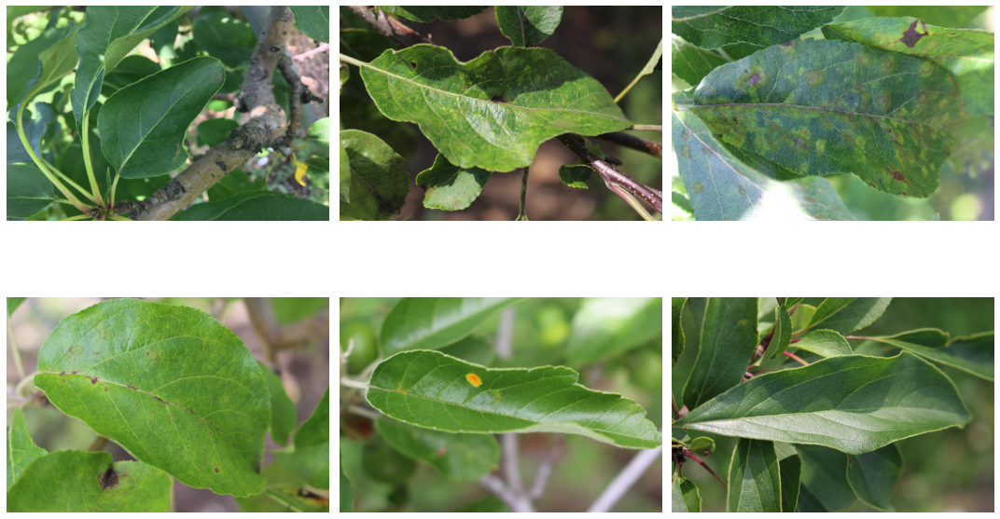

Display Random Images


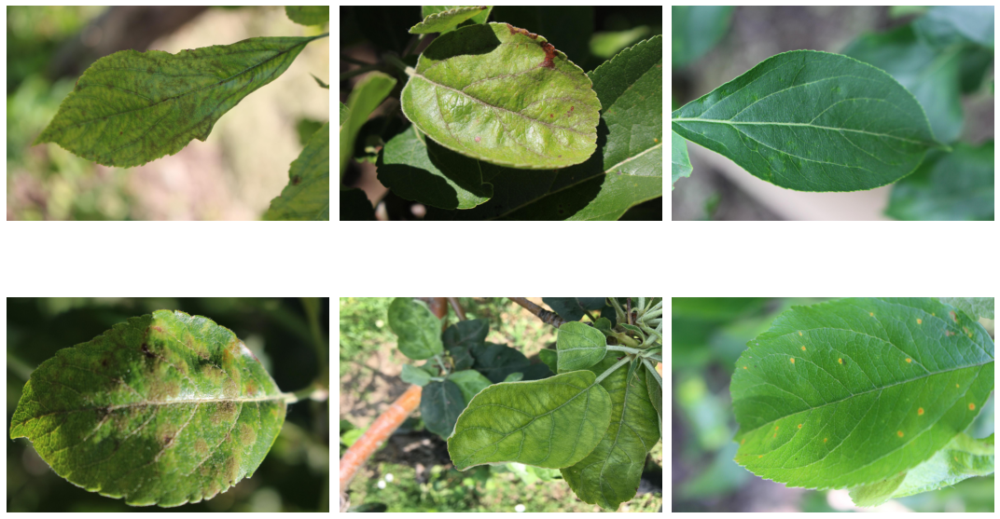

In [14]:
image_path='/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/images'
images = train['image_id'].values


random_images = [np.random.choice(images+'.jpg') for i in range(6)]


img_dir = image_path

print('Display Random Images')


plt.figure(figsize=(15,10))


for i in range(6):
    plt.subplot(2, 3, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    

plt.tight_layout()

In [15]:
import matplolib as plt

def display_images(images,im_path, condition):
    images=train['image_id'].values
    random_images=[np.random.choice(images+'.jpg') for i in range (6)]

    print(f'display {condition} images')
     
    plt.figure(figsize=(15,10))
    for i in range(6):
        plt.subplots(2,3,i+1)
        img=plt.imread(os.path.join(im_path,random_images[i])
        plt.imshow(img, cmap='gray')
        plt.axis('off')

    plt.tight_layout()    

SyntaxError: ignored

In [0]:
def display_images(images, Image_dir, condition):
    random_images = [np.random.choice(images+'.jpg') for i in range(6)]

    print(f"Display {condition} Images")

   # Adjust the size of your images
    plt.figure(figsize=(15,10))

  # Iterate and plot random images
    for i in range(6):
        plt.subplot(2, 3, i + 1)
        img = plt.imread(os.path.join(img_dir, random_images[i]))
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
# Adjust subplot parameters to give specified padding
    plt.tight_layout() 

Display healthy Images


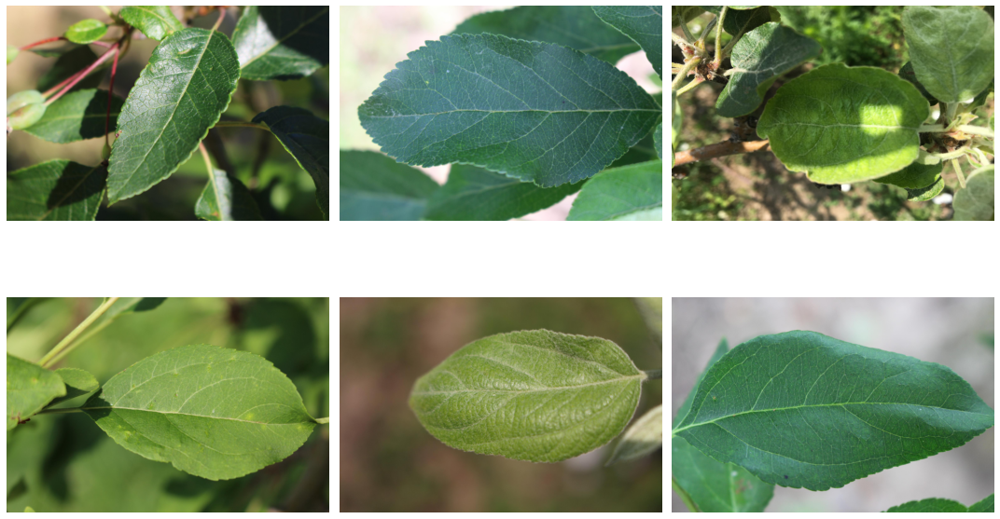

In [17]:
healthy=train[train['healthy']==1]['image_id'].to_list()
import numpy as np
healthy_images=np.array(healthy,dtype='object')
images=healthy_images
display_images(images,image_path,'healthy')

Display healthy Images


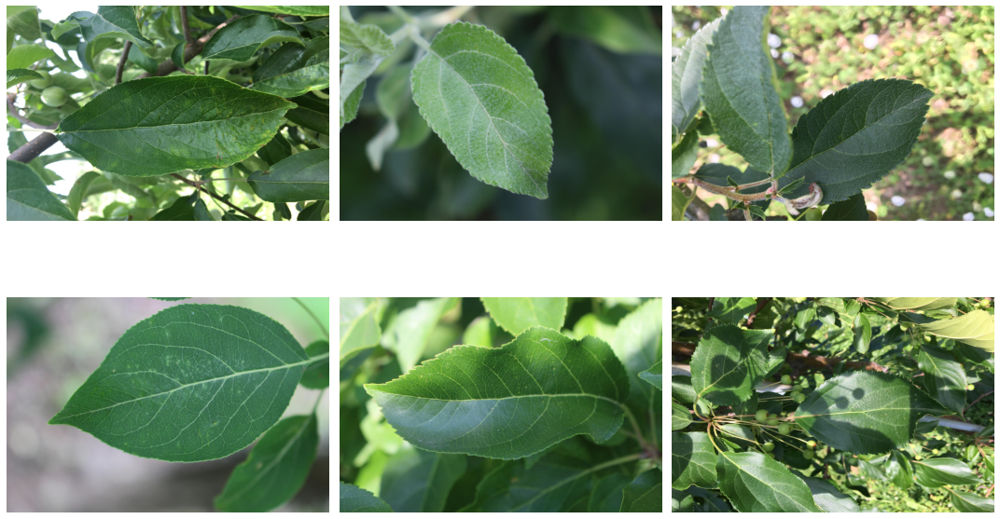

In [18]:
image_path='/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/images'
healthy_images = np.array(healthy,dtype='object')
images = healthy_images
display_images(images,image_path,'healthy')

Display rust Images


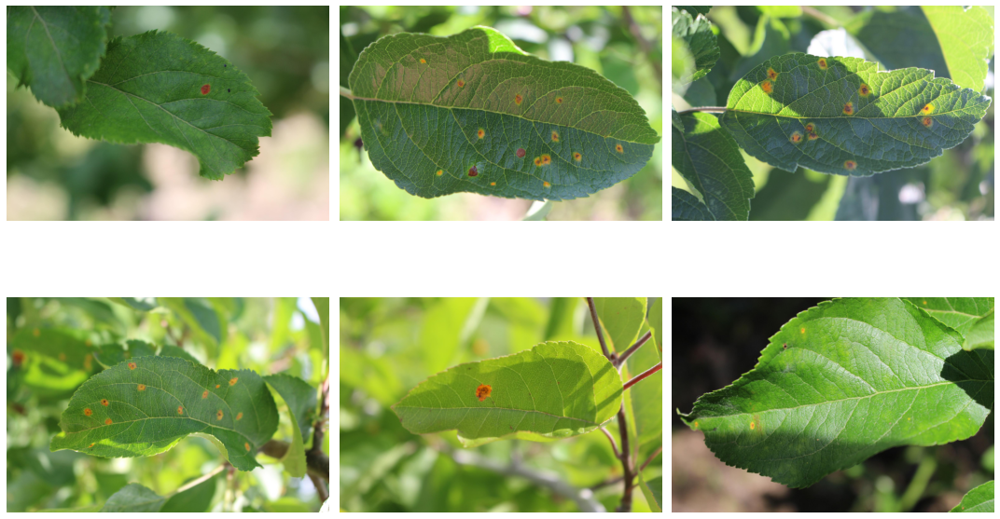

In [19]:
rust=train[train['rust']==1]['image_id'].to_list()
rust_image=np.array(rust,dtype='object')
images=rust_image
display_images(images,image_path,'rust')

Display scab Images


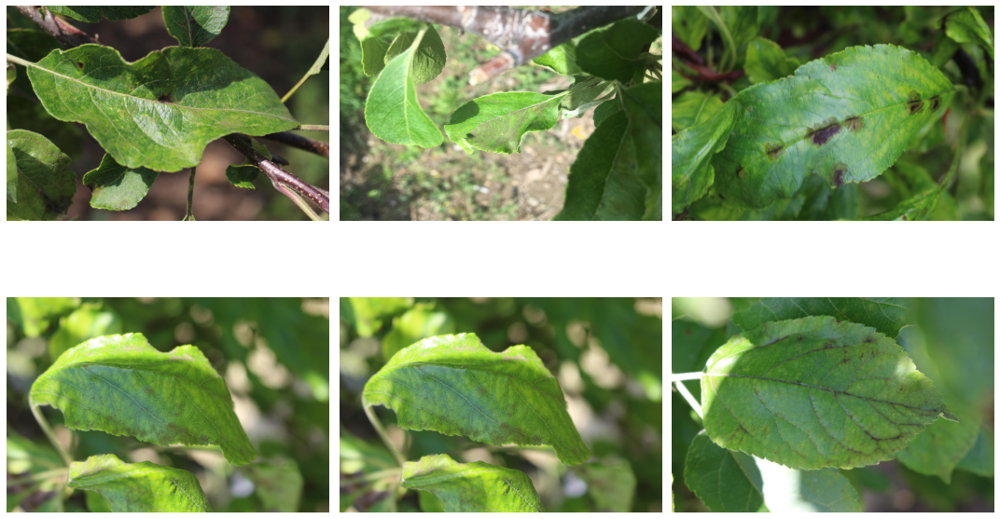

In [20]:
scab=train[train['scab']==1]['image_id'].to_list()
scab_image=np.array(scab,dtype='object')
images=scab_image
display_images(images,image_path,'scab')

Display multiple_diseases Images


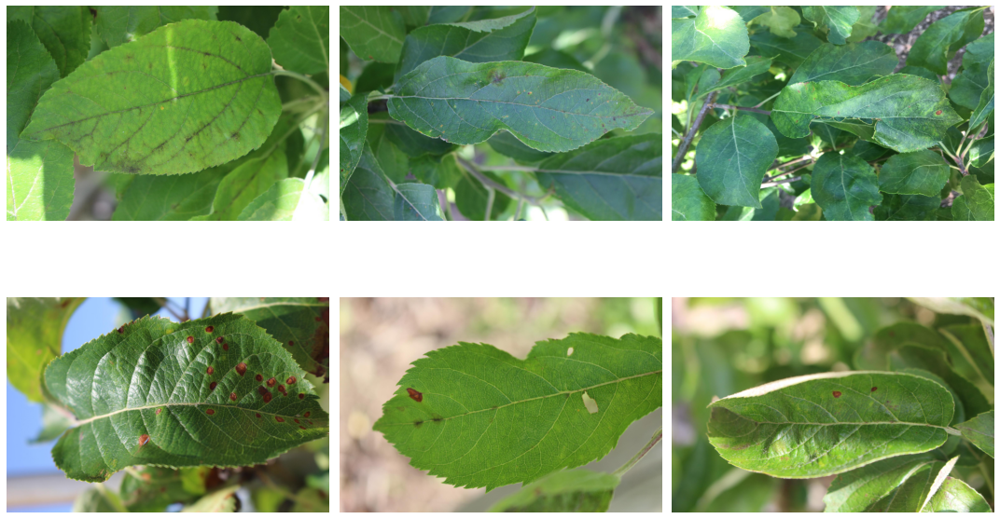

In [21]:
multi_diseases=train[train['multiple_diseases']==1]['image_id'].to_list()
multi_diseases_image=np.array(multi_diseases,dtype='object')
images=multi_diseases_image
display_images(images,image_path,'multiple_diseases')

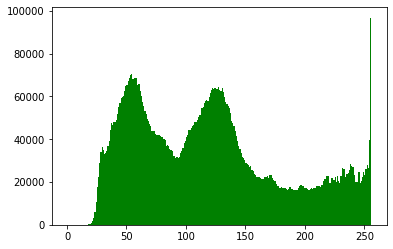

In [22]:

image_path='/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/images'
healthy=train[train['healthy']==1]['image_id'].to_list()
image_health=(healthy[0]+'.jpg')
import matplotlib.pyplot as plt
img=cv2.imread(os.path.join(image_path,image_health))
plt.hist(img.ravel(),256,[0,256],color='green')
plt.show()

maximum pixel value:255, minimum pixel value:7
mean pixel value:95.0 , standard value of the pixel:39.1


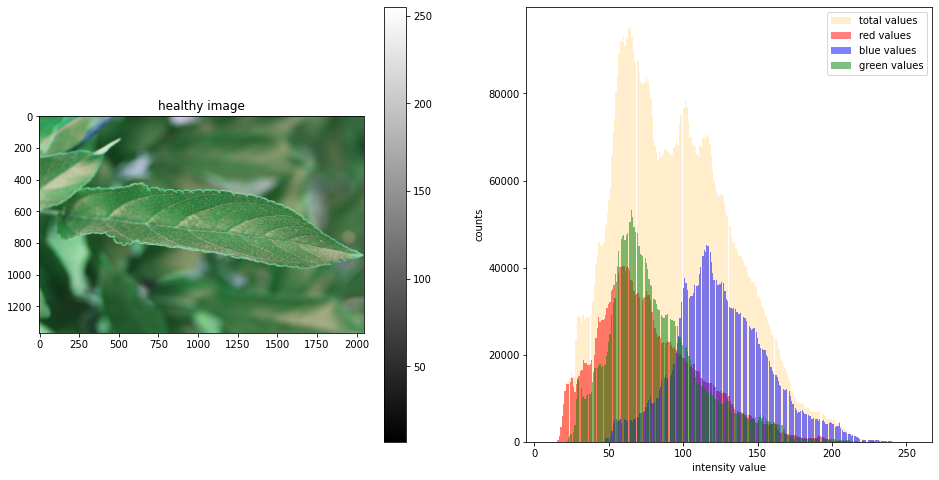

In [23]:
f=plt.figure(figsize=(16,8))
f.add_subplot(1,2,1)
sample_image=healthy[1]+'.jpg'
raw_image=cv2.imread(os.path.join(image_path,sample_image))
plt.imshow(raw_image,cmap='gray')
plt.colorbar()
plt.title('healthy image')

print(f'maximum pixel value:{raw_image.max()}, minimum pixel value:{raw_image.min()}')
print(f'mean pixel value:{raw_image.mean():.1f} , standard value of the pixel:{raw_image.std():.1f}')
f.add_subplot(1,2,2)
plt.hist(raw_image.ravel(), bins=256, color='orange', alpha=0.2)
plt.hist(raw_image[:,:,0].ravel(), bins=256, color='red', alpha=0.5)
plt.hist(raw_image[:,:,1].ravel(), bins=256 , color='blue', alpha=0.5)
plt.hist(raw_image[:,:,2].ravel() , bins=256, color='green', alpha=0.5)
plt.xlabel('intensity value')
plt.ylabel('counts')
plt.legend(['total values', 'red values','blue values', 'green values'])
plt.show()

maximum pixel value:255, minimum pixel value:0
mean pixel value:96.8 , standard value of the pixel:53.1


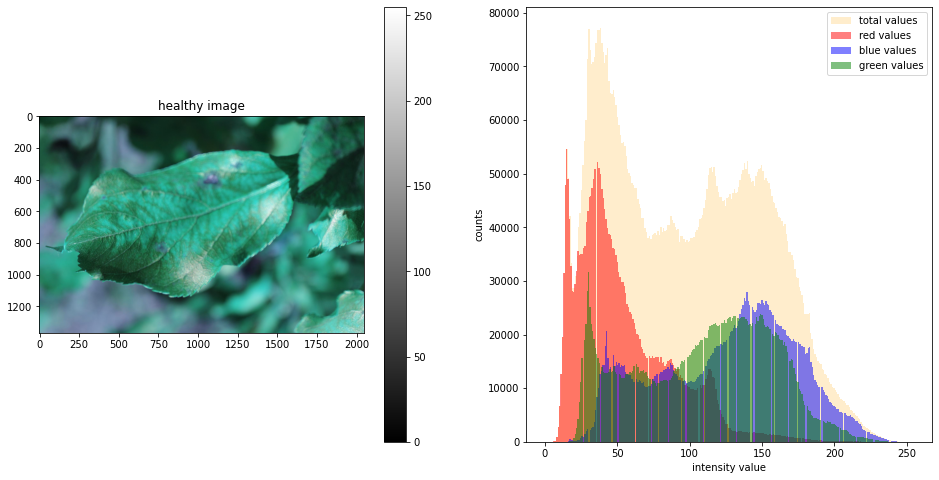

In [24]:
f=plt.figure(figsize=(16,8))
f.add_subplot(1,2,1)
sample_image=scab[0]+'.jpg'
raw_image=cv2.imread(os.path.join(image_path,sample_image))
plt.imshow(raw_image,cmap='gray')
plt.colorbar()
plt.title('healthy image')

print(f'maximum pixel value:{raw_image.max()}, minimum pixel value:{raw_image.min()}')
print(f'mean pixel value:{raw_image.mean():.1f} , standard value of the pixel:{raw_image.std():.1f}')
f.add_subplot(1,2,2)
plt.hist(raw_image.ravel(), bins=256, color='orange', alpha=0.2)
plt.hist(raw_image[:,:,0].ravel(), bins=256, color='red', alpha=0.5)
plt.hist(raw_image[:,:,1].ravel(), bins=256 , color='blue', alpha=0.5)
plt.hist(raw_image[:,:,2].ravel() , bins=256, color='green', alpha=0.5)
plt.xlabel('intensity value')
plt.ylabel('counts')
plt.legend(['total values', 'red values','blue values', 'green values'])
plt.show()

maximum pixel value:255, minimum pixel value:0
mean pixel value:88.1 , standard value of the pixel:57.1


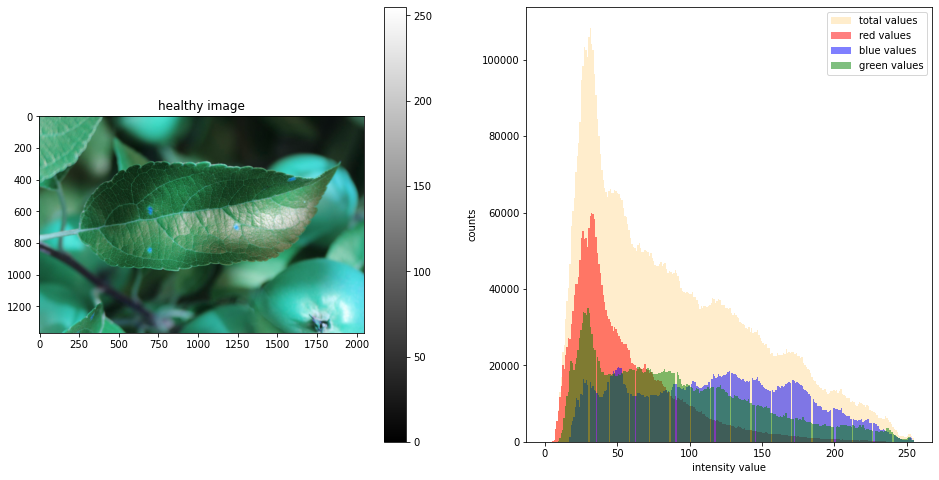

In [25]:
f=plt.figure(figsize=(16,8))
f.add_subplot(1,2,1)
sample_image=rust[1]+'.jpg'
raw_image=cv2.imread(os.path.join(image_path,sample_image))
plt.imshow(raw_image,cmap='gray')
plt.colorbar()
plt.title('healthy image')

print(f'maximum pixel value:{raw_image.max()}, minimum pixel value:{raw_image.min()}')
print(f'mean pixel value:{raw_image.mean():.1f} , standard value of the pixel:{raw_image.std():.1f}')
f.add_subplot(1,2,2)
plt.hist(raw_image.ravel(), bins=256, color='orange', alpha=0.2)
plt.hist(raw_image[:,:,0].ravel(), bins=256, color='red', alpha=0.5)
plt.hist(raw_image[:,:,1].ravel(), bins=256 , color='blue', alpha=0.5)
plt.hist(raw_image[:,:,2].ravel() , bins=256, color='green', alpha=0.5)
plt.xlabel('intensity value')
plt.ylabel('counts')
plt.legend(['total values', 'red values','blue values', 'green values'])
plt.show()

maximum pixel value:255, minimum pixel value:0
mean pixel value:105.2 , standard value of the pixel:56.6


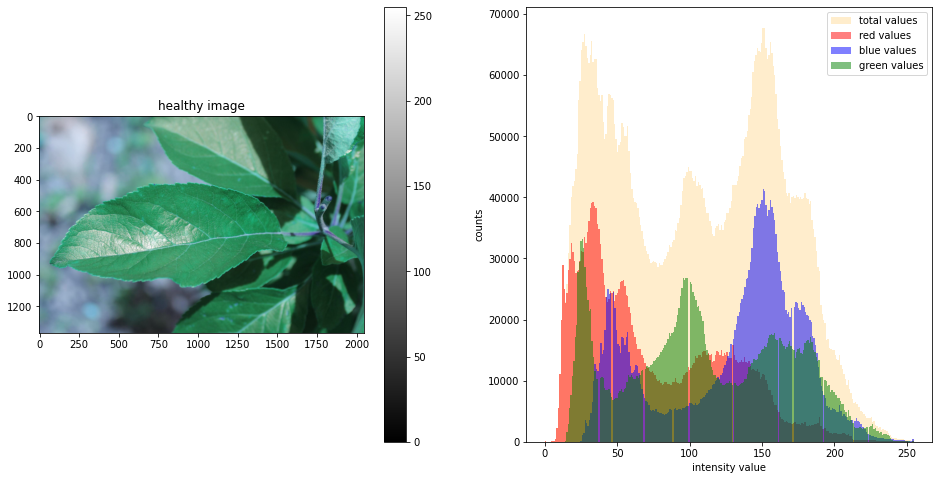

In [26]:
f=plt.figure(figsize=(16,8))
f.add_subplot(1,2,1)
sample_image=multi_diseases[7]+'.jpg'
raw_image=cv2.imread(os.path.join(image_path,sample_image))
plt.imshow(raw_image,cmap='gray')
plt.colorbar()
plt.title('healthy image')

print(f'maximum pixel value:{raw_image.max()}, minimum pixel value:{raw_image.min()}')
print(f'mean pixel value:{raw_image.mean():.1f} , standard value of the pixel:{raw_image.std():.1f}')
f.add_subplot(1,2,2)
plt.hist(raw_image.ravel(), bins=256, color='orange', alpha=0.2)
plt.hist(raw_image[:,:,0].ravel(), bins=256, color='red', alpha=0.5)
plt.hist(raw_image[:,:,1].ravel(), bins=256 , color='blue', alpha=0.5)
plt.hist(raw_image[:,:,2].ravel() , bins=256, color='green', alpha=0.5)
plt.xlabel('intensity value')
plt.ylabel('counts')
plt.legend(['total values', 'red values','blue values', 'green values'])
plt.show()

VISUALIZATION WITH CHANGING THE COLORSPACES 

In [0]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('messi5.jpg',0)
edges = cv2.Canny(img,100,200)

plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

In [29]:
import cv2
from matplotlib import pyplot as plt

image_path='/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/images'
healthy=train[train['healthy']==1]['image_id'].to_list()
healthy_image=healthy[0]
img =cv2.imread(healthy_image,0)
edge_image=cv2.canny(img,100,200)
plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(edge_image, cmap='gray')
plt.xticks([])
plt.yticks([])
plt.show()

AttributeError: ignored

In [0]:
from scipy import ndimage

def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
    
    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)
    
    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)
    
    return (G, theta)

In [32]:

image_path='/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/images'
healthy=train[train['healthy']==1]['image_id'].to_list()
image_health=(healthy[0]+'.jpg')

img=cv2.imread(os.path.join(image_path,image_health))

sobel_filters(img)

RuntimeError: ignored

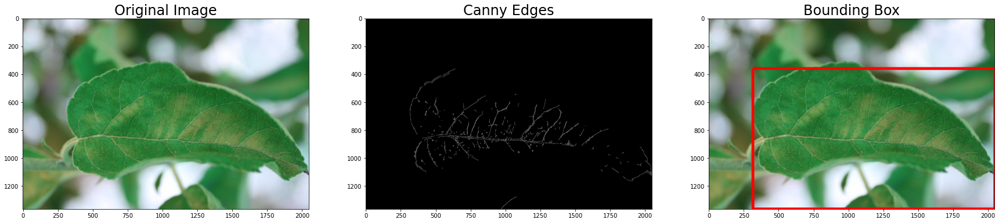

In [34]:

image_path='/content/drive/My Drive/plant pathology/plant-pathology-2020-fgvc7/images'
healthy=train[train['healthy']==1]['image_id'].to_list()
image_health=(healthy[0]+'.jpg')

img=cv2.imread(os.path.join(image_path,image_health))

def edge_and_cut(img):
    emb_img = img.copy()
    edges = cv2.Canny(img, 100, 200)
    edge_coors = []
    for i in range(edges.shape[0]):
        for j in range(edges.shape[1]):
            if edges[i][j] != 0:
                edge_coors.append((i, j))
    
    row_min = edge_coors[np.argsort([coor[0] for coor in edge_coors])[0]][0]



    row_max = edge_coors[np.argsort([coor[0] for coor in edge_coors])[-1]][0]
    col_min = edge_coors[np.argsort([coor[1] for coor in edge_coors])[0]][1]
    col_max = edge_coors[np.argsort([coor[1] for coor in edge_coors])[-1]][1]
    new_img = img[row_min:row_max, col_min:col_max]
    
    emb_img[row_min-10:row_min+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_max-10:row_max+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_min:row_max, col_min-10:col_min+10] = [255, 0, 0]
    emb_img[row_min:row_max, col_max-10:col_max+10] = [255, 0, 0]
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 20))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(edges, cmap='gray')
    ax[1].set_title('Canny Edges', fontsize=24)
    ax[2].imshow(emb_img, cmap='gray')
    ax[2].set_title('Bounding Box', fontsize=24)
    plt.show()

edge_and_cut(img)
